# Assignment 2

**Course:** Introdução ao Processamento Digital de Imagem (MO443)  
**Goal:** To apply the discrete fourier transformation over images using Python programming language  
**Author:** Lucas Oliveira David, 188972 --- <lucas.david@ic.unicamp.br>

In [1]:
class Config:
    image_sizes = (300, 300)
    images_used = 10
    
    buffer_size = 8 * images_used
    seed = 68215

### Setup

In [2]:
! pip -qq install tensorflow_addons

from math import ceil

import numpy as np
import tensorflow as tf
import tensorflow_probability as tfp
import tensorflow_addons as tfa
import tensorflow_datasets as tfds

import matplotlib.pyplot as plt

     |████████████████████████████████| 706kB 6.0MB/s 


In [3]:
def preprocessing_fn(image, label):
  # Adjust the image to be at least of size `Config.image_sizes`, which
  # garantees the random_crop operation below will work.
  current = tf.cast(tf.shape(image)[:2], tf.float32)
  target = tf.convert_to_tensor(Config.image_sizes, tf.float32)
  ratio = tf.reduce_max(tf.math.ceil(target / current))
  new_sizes = tf.cast(current*ratio, tf.int32)

  image = tf.image.resize(image, new_sizes, preserve_aspect_ratio=True)

  # Crop randomly.
  image = tf.image.resize_with_crop_or_pad(image, *Config.image_sizes)

  return image, label

In [4]:
def visualize(
    image,
    title=None,
    rows=2,
    cols=None,
    cmap=None,
    figsize=(12, 6)
):
  if image is not None:
    if isinstance(image, list) or len(image.shape) > 3:  # many images
      plt.figure(figsize=figsize)
      cols = cols or ceil(len(image) / rows)
      for ix in range(len(image)):
        plt.subplot(rows, cols, ix+1)
        visualize(image[ix],
                 cmap=cmap,
                 title=title[ix] if title is not None and len(title) > ix else None)
      plt.tight_layout()
      return

    if isinstance(image, tf.Tensor): image = image.numpy()
    if image.shape[-1] == 1: image = image[..., 0]
    plt.imshow(image, cmap=cmap)
  
  if title is not None: plt.title(title)
  plt.axis('off')

In [5]:
(train_ds,), info = tfds.load(
  'tf_flowers',
  split=['train[:1%]'],
  with_info=True,
  as_supervised=True)

int2str = info.features['label'].int2str

images_set = (train_ds
              .shuffle(Config.buffer_size, Config.seed)
              .map(preprocessing_fn, num_parallel_calls=tf.data.AUTOTUNE)
              .batch(Config.images_used)
              .take(1))

images, target = next(iter(images_set))
images = tf.cast(images, tf.float32)
labels = [int2str(l) for l in target]

local data directory. If you'd instead prefer to read directly from our public
GCS bucket (recommended if you're running on GCP), you can instead pass
`try_gcs=True` to `tfds.load` or set `data_dir=gs://tfds-data/datasets`.





Dataset tf_flowers downloaded and prepared to /root/tensorflow_datasets/tf_flowers/3.0.1. Subsequent calls will reuse this data.


## TF-Flowers (Image Dataset)

We utilize 10 random images from the [TF-Flowers](https://www.tensorflow.org/datasets/catalog/tf_flowers) dataset, which can be downloaded in the tf-records format using the `tensorflow-datasets` library.

This dataset represents a multi-class (mono-label) image classification problem, and comprises 3,670 photographs of flowers associated with one of the following labels: *dandelion*, *daisy*, *tulips*, *sunflowers* or *roses*.

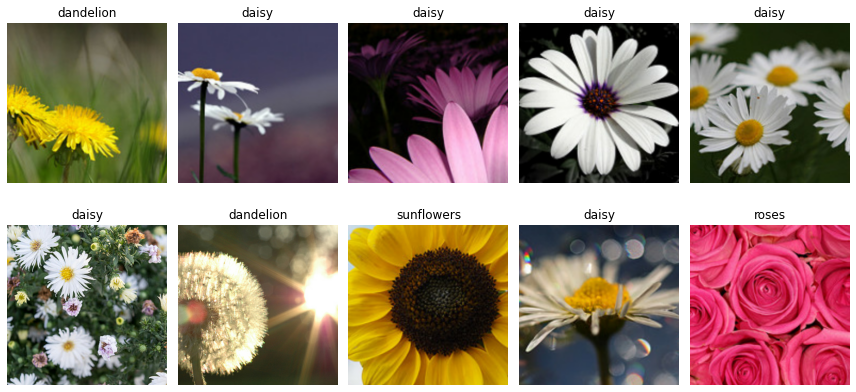

In [6]:
#@title

visualize(
  tf.cast(images, tf.uint8),
  labels
)

## Discrete Fourier Transform

### Identity

In [7]:
x = tf.image.rgb_to_grayscale(images)

y = tf.cast(x, tf.complex64)
y = tf.signal.fft2d(y[..., 0])

s = tf.signal.fftshift(y, axes=(1, 2))
z = tf.signal.ifftshift(s, axes=(1, 2))
w = tf.signal.ifft2d(z)

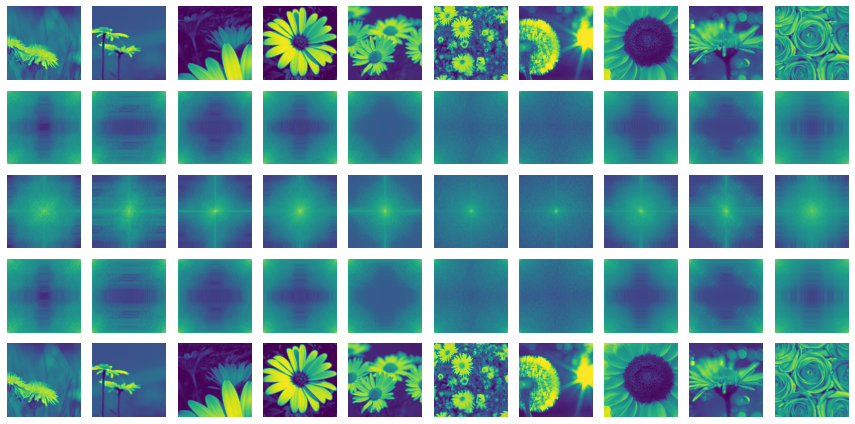

In [8]:
#@title Images → Spectrum → Shifted → Unshifted → Reconstructed

visualize(
  [
    *tf.cast(x, tf.int32).numpy(),
    *tf.math.log(tf.abs(y))[..., tf.newaxis].numpy(),
    *tf.math.log(tf.abs(s))[..., tf.newaxis].numpy(),
    *tf.math.log(tf.abs(z))[..., tf.newaxis].numpy(),
    *tf.cast(w, tf.int32)[..., tf.newaxis].numpy()
  ],
  rows=5,
)

### Circular Low-pass Filter

In [9]:
def as_absolute_length(measures, height, width):
  if isinstance(measures, (int, float)):
    measures = [measures]
  
  return tf.convert_to_tensor([
    (m
     if isinstance(m, int)
     else int(m*min(height, width) // 2))
    for m in measures
  ])


def circ_filter2d(radius, shape, dtype=tf.float32):
  h, w = shape[-2:]

  ih = tf.abs(tf.range(h) -h//2)  # [... 2 1 0 1 2 ...]
  ih = tf.reshape(ih, (-1, 1))
  iw = tf.abs(tf.range(w) -w//2)

  radius = as_absolute_length(radius, h, w)
  radius = tf.reshape(radius, (-1, 1, 1))

  return tf.cast(ih**2 + iw**2 < radius**2, dtype)  # circle eq.

circ_filter2d_like = lambda radius, a: circ_filter2d(radius, a.shape, a.dtype)

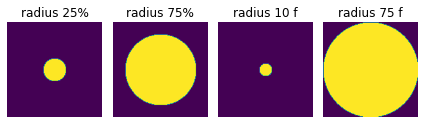

In [10]:
#@title

visualize(
  circ_filter2d([.25, .75, 10, 75], (150, 150))[..., tf.newaxis].numpy(),
  title=['radius 25%', 'radius 75%', 'radius 10 f', 'radius 75 f'],
  rows=1,
  figsize=(6, 2))

In [11]:
m = circ_filter2d_like(70, s) * s
z = tf.signal.ifftshift(m, axes=(-2, -1))
w = tf.signal.ifft2d(z)

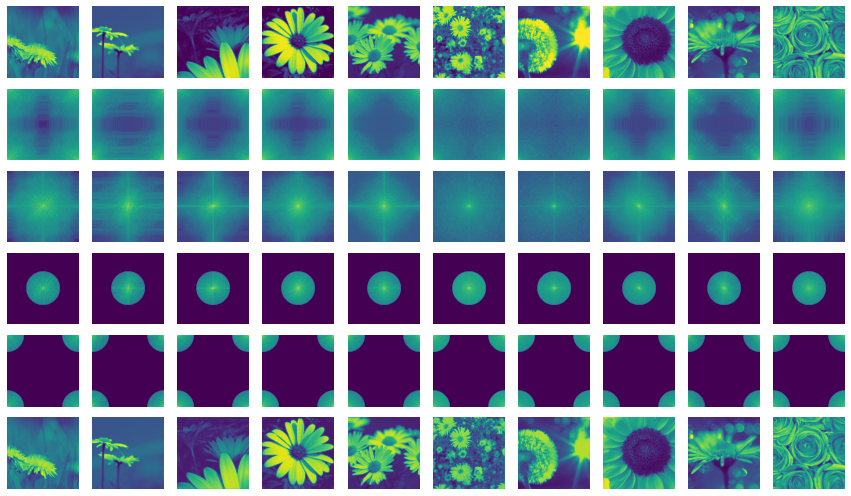

In [12]:
#@title Images → Spectrum → Shifted → Masked → Unshifted → Reconstructed

visualize([
  *tf.cast(x, tf.int32).numpy(),
  *tf.math.log(tf.abs(y))[..., tf.newaxis].numpy(),
  *tf.math.log(tf.abs(s))[..., tf.newaxis].numpy(),
  *tf.math.log(tf.abs(m) + 1)[..., tf.newaxis].numpy(),
  *tf.math.log(tf.abs(z) + 1)[..., tf.newaxis].numpy(),
  *tf.cast(w, tf.int32)[..., tf.newaxis].numpy()
], rows=6, figsize=(12, 7))

#### Experimenting with Multiple Radius Values

In [13]:
EXPERIMENTED_RADII = (5, 10, 20, 40, 70, 150)

masks = circ_filter2d_like(EXPERIMENTED_RADII, s)

In [14]:
m = masks[:, tf.newaxis, ...] * s
z = tf.signal.ifftshift(m, axes=(-2, -1))
w = tf.signal.ifft2d(z)

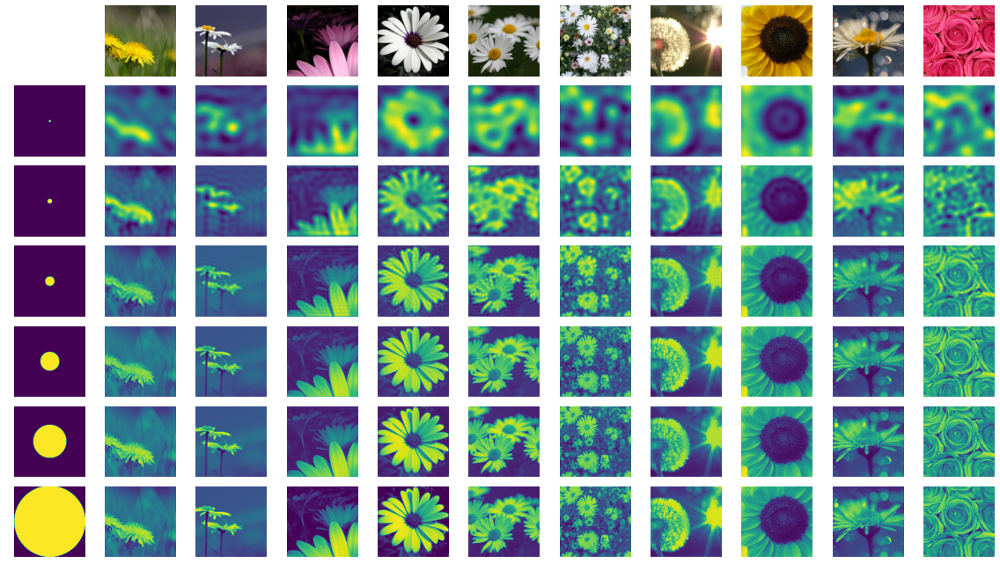

In [15]:
#@title

vis = tf.concat((masks[:, tf.newaxis, ...], w), axis=1)

visualize(
  [
    None,
    *tf.cast(images, tf.uint8).numpy(),
    *tf.reshape(tf.cast(vis, tf.int32), (-1, *Config.image_sizes, 1)).numpy(),
  ],
  rows=len(w)+1,
  cols=len(images)+1,
  figsize=(16, 9)
)

### Butterworth Low-pass Filter

In [16]:
def butterworth_filter2d(radius, shape, n=1, dtype=tf.float32):
  h, w = shape[-2:]

  ih = tf.abs(tf.range(h) -h//2)
  ih = tf.reshape(ih, (-1, 1))
  iw = tf.abs(tf.range(w) -w//2)

  radius = as_absolute_length(radius, h, w)
  radius = tf.reshape(radius, (-1, 1, 1))

  return tf.cast(
    1 / (1 + (ih**2 + iw**2) / radius**(2*n)),
    dtype
  )

butterworth_filter2d_like = lambda radius, a, n=1: butterworth_filter2d(radius, a.shape, n, a.dtype)

In [17]:
EXPERIMENTED_RADII = (.01, .02, .03, .05, .1, .5)

masks = butterworth_filter2d_like(EXPERIMENTED_RADII, s)

m = masks[:, tf.newaxis, ...] * s
z = tf.signal.ifftshift(m, axes=(-2, -1))
w = tf.signal.ifft2d(z)

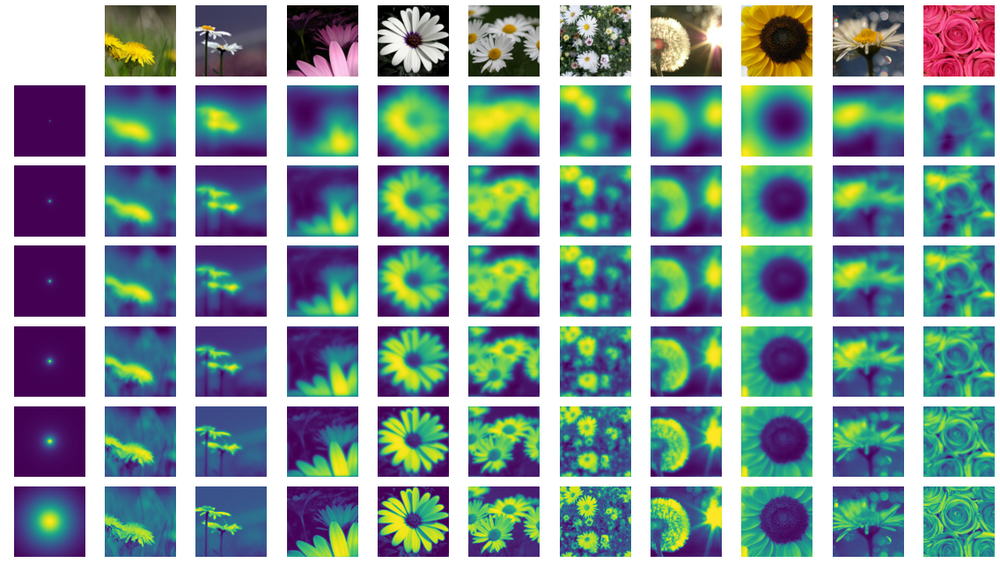

In [18]:
#@title

vis = tf.concat((masks[:, tf.newaxis, ...], w), axis=1)

visualize(
  [
    None,
    *tf.cast(images, tf.uint8).numpy(),
    *tf.reshape(tf.abs(vis), (-1, *Config.image_sizes, 1)).numpy(),
  ],
  rows=len(w)+1,
  cols=len(images)+1,
  figsize=(16, 9)
)

### High-pass Filter

In [19]:
EXPERIMENTED_RADII = (1, 2, 3, 10, 40, 70)

masks = 1 -circ_filter2d_like(EXPERIMENTED_RADII, s)

m = masks[:, tf.newaxis, ...] * s
z = tf.signal.ifftshift(m, axes=(-2, -1))
w = tf.signal.ifft2d(z)

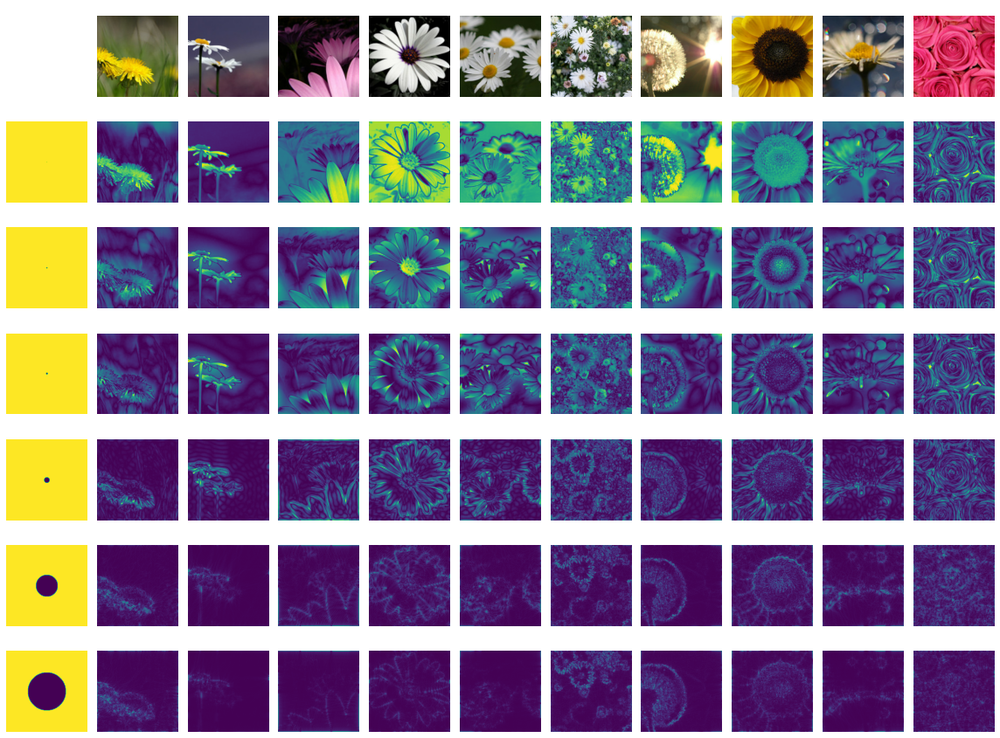

In [20]:
#@title

vis = tf.concat((masks[:, tf.newaxis, ...], w), axis=1)

visualize(
  [
    None,
    *tf.cast(images, tf.uint8).numpy(),
    *tf.reshape(tf.abs(vis), (-1, *Config.image_sizes, 1)).numpy(),
  ],
  rows=len(w)+1,
  cols=len(images)+1,
  figsize=(16, 12)
)

### Band-pass Filter

In [21]:
RADII_L = (1, 5, 10, 10, 30, 40, 70, 30, 5)
RADII_H = (3, 10, 15, 50, 90, 80, 140, 150, 150)

masks = circ_filter2d_like(RADII_H, s) -circ_filter2d_like(RADII_L, s)

m = masks[:, tf.newaxis, ...] * s
z = tf.signal.ifftshift(m, axes=(-2, -1))
w = tf.signal.ifft2d(z)

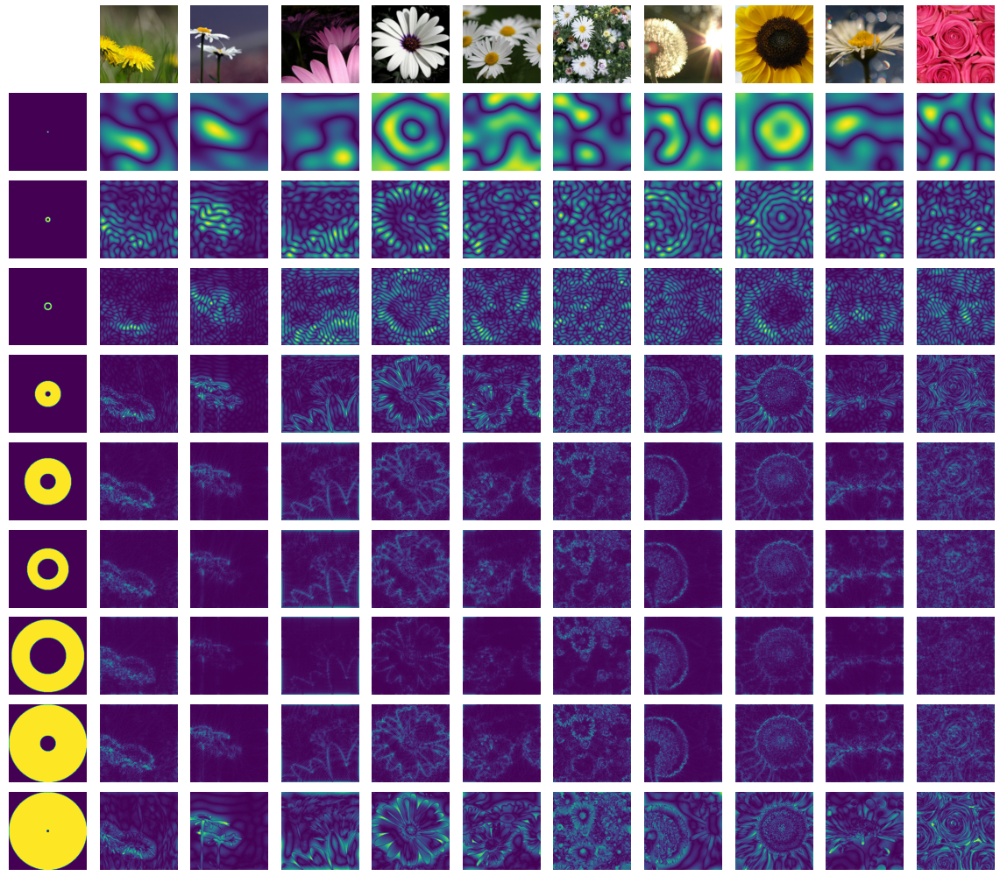

In [22]:
#@title

vis = tf.concat((masks[:, tf.newaxis, ...], w), axis=1)

visualize(
  [
    None,
    *tf.cast(images, tf.uint8).numpy(),
    *tf.reshape(tf.abs(vis), (-1, *Config.image_sizes, 1)).numpy(),
  ],
  rows=len(w)+1,
  cols=len(images)+1,
  figsize=(16, 14)
)

### Compressing Images Using The DFT

In [23]:
THRESHOLDS = [10, 50, 90, 95, 99, 99.9]

masks = tf.abs(s)
th = tfp.stats.percentile(masks, THRESHOLDS, axis=(1, 2))
th = tf.transpose(th)
th = tf.reshape(th, (*th.shape, 1, 1))
masks = tf.cast(masks[:, tf.newaxis, ...] > th, tf.complex64)

m = masks * s[:, tf.newaxis, ...]
z = tf.signal.ifftshift(m, axes=(-2, -1))
w = tf.signal.ifft2d(z)

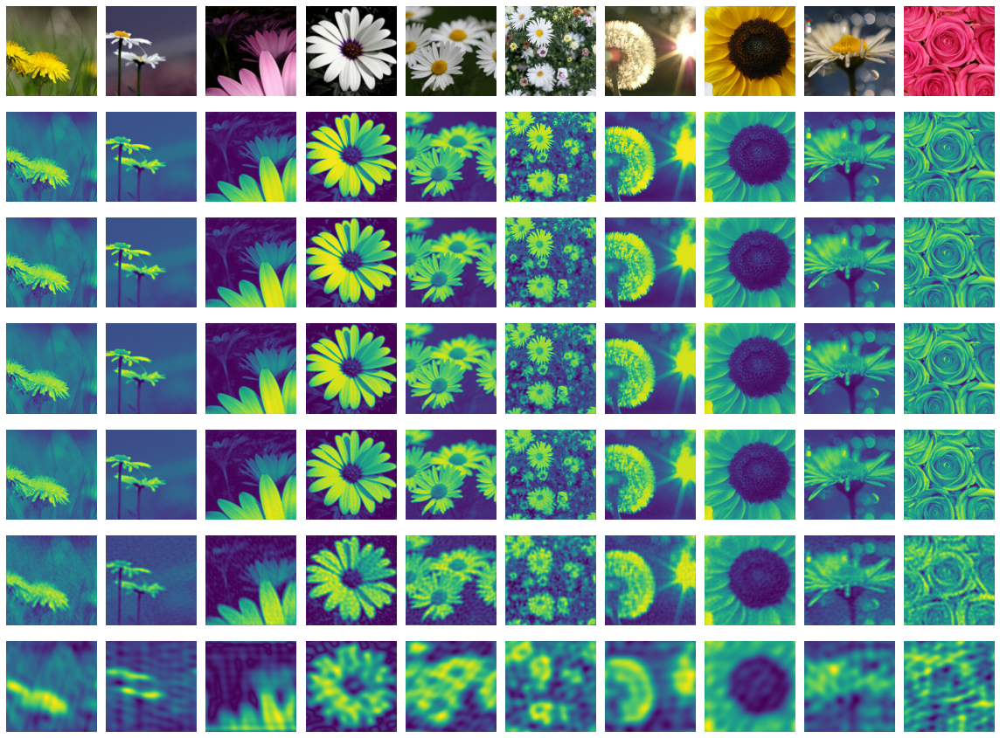

In [24]:
#@title

visualize(
  [
    *tf.cast(images, tf.uint8).numpy(),
    *tf.reshape(
      tf.transpose(tf.abs(w), (1, 0, 2, 3)),
      (-1, *Config.image_sizes, 1)
    ).numpy(),
  ],
  rows=w.shape[1]+1,
  figsize=(16, 12)
)

### Rotation

In [98]:
rotations = tf.random.normal(images.shape[:1]) * np.pi/2

In [99]:
r = tfa.image.rotate(x, rotations)
zx, zr = (
  tf.signal.fftshift(
    tf.signal.fft2d(
      tf.cast(z[..., 0], tf.complex64)
    ),
    axes=(1, 2)
  )
  for z in (x, r)
)

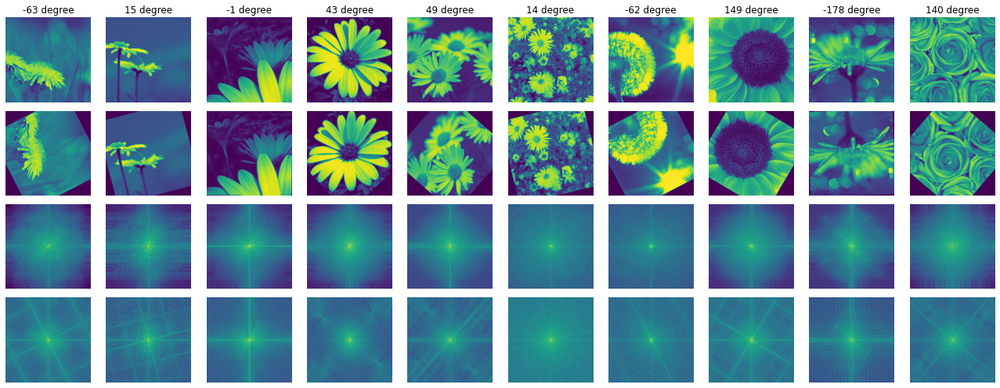

In [100]:
#@title Images, Rotated and Fourier Spectra of Both

visualize(
  [
    *tf.cast(x, tf.uint8).numpy(),
    *tf.cast(r, tf.uint8).numpy(),
   *tf.math.log(tf.abs(zx)+1)[..., tf.newaxis].numpy(),
    *tf.math.log(tf.abs(zr)+1)[..., tf.newaxis].numpy(),
  ],
  title=[f'{d} degree' for d in tf.round(180*rotations/np.pi).numpy().astype(int)],
  rows=4,
  figsize=(18, 7)
)